# **Revamping Our Image Classification Model: Enhancing Accuracy with Advanced Techniques**

In the last notebook, we built a convolutional neural network (CNN) to classify images into two categories. The model showed some promising results, but we believe there is room for improvement. In this notebook, we will focus on enhancing the performance of the model by implementing some techniques such as data augmentation, and fine-tuning. We will also evaluate the impact of these techniques on the model's accuracy and loss. By the end of this notebook, we hope to have a more robust and accurate model for image classification.

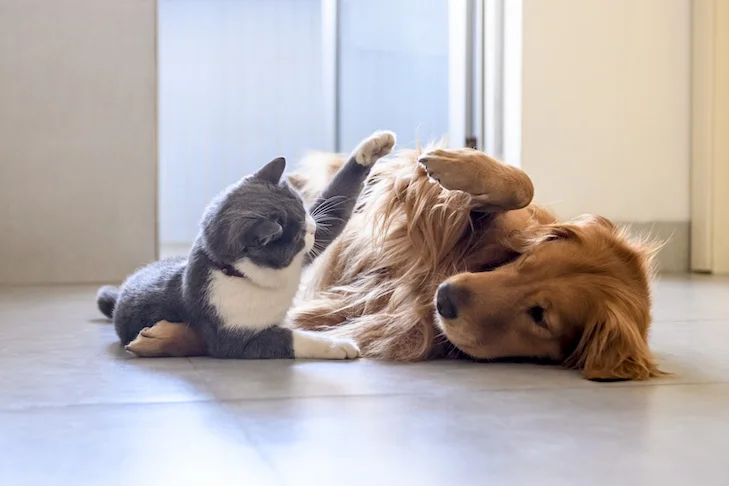

Let's start by initialising the environment we will be working in, this notebook was run on Kaggle kernels because of the high computational power needed for image processing and CNN architectures, so it is recommended to run it in a similar isolated environment.


Next we load the dataset we will use for this classification problem:

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.3443.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.10728.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.790.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.10063.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.2618.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.2875.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.5288.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.4223.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.4253.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.7153.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.2888.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.7275.jpg
/kaggle/input/dog-vs-cat-fastai/dogscats/dogscats/valid/dogs/dog.10894.jpg
/kaggle/input/dog-vs-cat-fastai/dogs

Once the environment is initialised, let's start by setting up some libraries that we will use in this notebook. The code imports various Python libraries that are commonly used in data analysis and machine learning projects.

In [4]:
# Libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
import pickle
import warnings
from sklearn.model_selection import train_test_split
# Set Matplotlib defaults
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large',
       titleweight='bold', titlesize=18, titlepad=10)
plt.rc('image', cmap='magma')
warnings.filterwarnings("ignore") # to clean up output cells
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

Next, this code sets a random seed to ensure that the results of the project are reproducible, meaning that others can replicate the findings. It also sets the Python hash seed to make sure the hash values of objects in your code are deterministic, which can impact the order of iteration and therefore the outcome of operations that depend on the order.

In [5]:
# Reproducability
def set_seed(seed=31415):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    #os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed()

## **Pipeline and Preprocessing**

The code loads the training and validation sets of image data and applies a data pipeline to prepare the data for deep learning models.

The image_dataset_from_directory function is used to load the data from the specified directory paths. The labels are inferred from the directory structure and the label mode is set to binary. The images are resized to 128x128 pixels and interpolated using the nearest neighbor method. The batch size is set to 32 and the data is shuffled in the training set but not in the validation set.

The convert_to_float function is defined to convert the pixel values of the images to float32 data type. The AUTOTUNE constant is defined to allow TensorFlow to automatically determine the optimal buffer size for prefetching data, which can improve performance.

The data pipeline applies the convert_to_float function to each image and label pair, caches the results in memory, and prefetches the next batch of data to speed up training. This prepares the data for efficient training of deep learning models.

In [6]:
# Load training and validation sets
from tensorflow.keras.preprocessing import image_dataset_from_directory

ds_train_ = image_dataset_from_directory(
    '/kaggle/input/dog-vs-cat-fastai/dogscats/train',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
    interpolation='nearest',
    batch_size=32,
    shuffle=True,
)

ds_valid_ = image_dataset_from_directory(
    '/kaggle/input/dog-vs-cat-fastai/dogscats/valid',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
    interpolation='nearest',
    batch_size=32,
    shuffle=False,
)

# Data Pipeline
def convert_to_float(image, label):
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    return image, label

AUTOTUNE = tf.data.experimental.AUTOTUNE
ds_train = (
    ds_train_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)
ds_valid = (
    ds_valid_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)

Found 23000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


The output indicates that there are a total of 23,000 image files belonging to 2 classes in the training set, and 2,000 image files belonging to the same 2 classes in the validation set.

This information is important for understanding the size and structure of the data being used in the project. It also confirms that the image_dataset_from_directory function was able to correctly identify and load the data from the specified directories.

## **Exploring Augmentation**

This section explores data augmentation techniques for image data, which involve applying random transformations to the original images to create new training examples.

#### **Importance**
For the problem of cat vs dog prediction, data augmentation is important because it can help to prevent overfitting of the model to the training data, and improve the generalization performance on unseen data. By creating new examples with slightly different variations of the original images, the model can learn to recognize the underlying patterns of the images more robustly and accurately. This can lead to better prediction performance and more reliable results.






#### **a) Data Augmentation: Translation:**

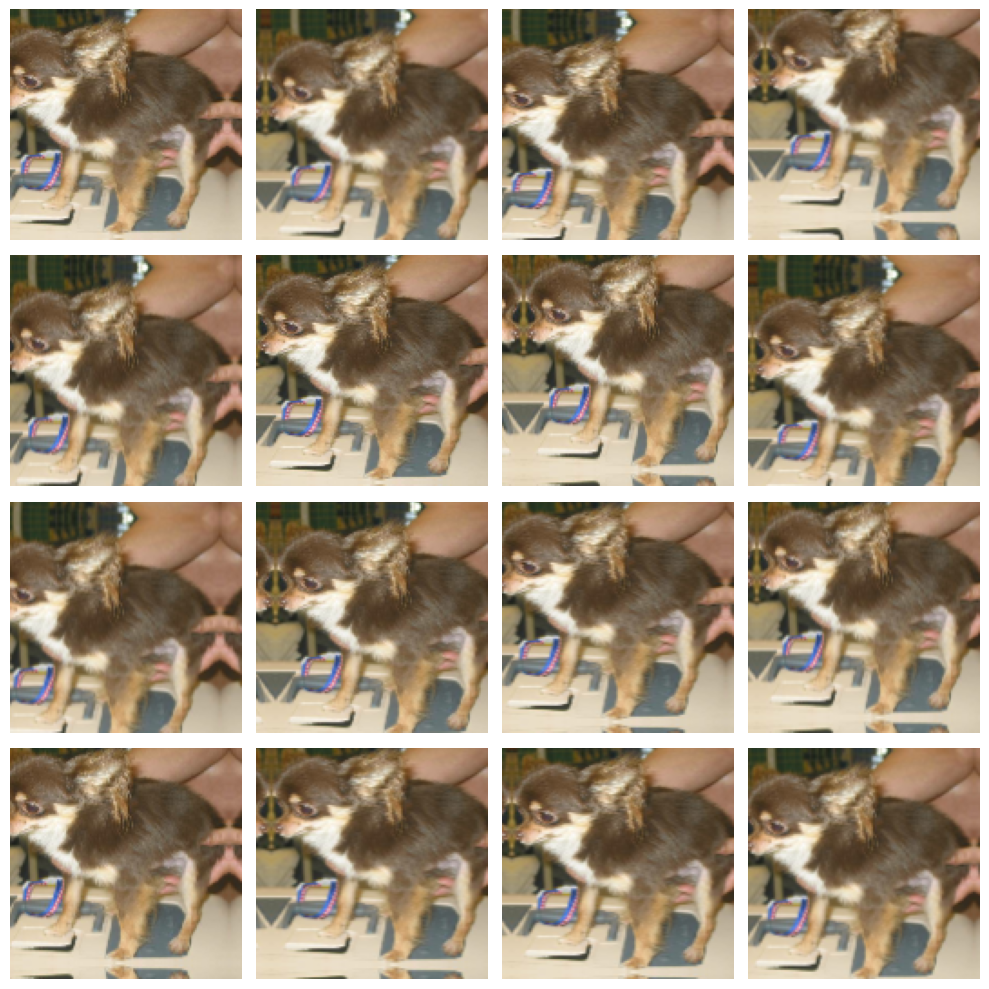

In [7]:
# all of the "factor" parameters indicate a percent-change
augment = keras.Sequential([
    #preprocessing.RandomContrast(factor=0.5),
    #preprocessing.RandomFlip(mode='horizontal'), # meaning, left-to-right
    # preprocessing.RandomFlip(mode='vertical'), # meaning, top-to-bottom
    # preprocessing.RandomWidth(factor=0.15), # horizontal stretch
    # preprocessing.RandomRotation(factor=0.20),
    preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
])


ex = next(iter(ds_train.unbatch().map(lambda x, y: x).batch(1)))

plt.figure(figsize=(10,10))
for i in range(16):
    image = augment(ex, training=True)
    plt.subplot(4, 4, i+1)
    plt.imshow(tf.squeeze(image))
    plt.axis('off')
plt.show()

#### **b) Data Augmentation: Flips:**

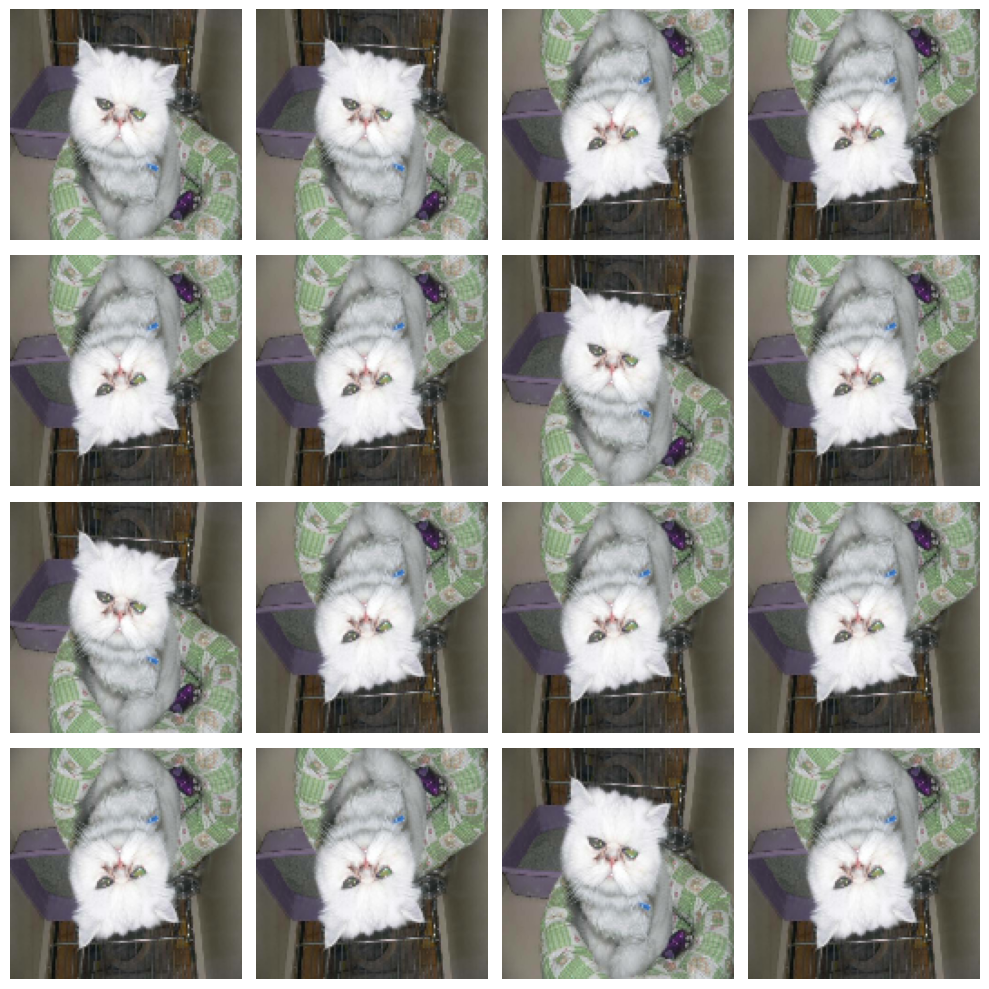

In [8]:
# all of the "factor" parameters indicate a percent-change
augment = keras.Sequential([
    #preprocessing.RandomContrast(factor=0.5),
    #preprocessing.RandomFlip(mode='horizontal'), # meaning, left-to-right
    preprocessing.RandomFlip(mode='vertical'), # meaning, top-to-bottom
    # preprocessing.RandomWidth(factor=0.15), # horizontal stretch
    # preprocessing.RandomRotation(factor=0.20),
    # preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
])


ex = next(iter(ds_train.unbatch().map(lambda x, y: x).batch(1)))

plt.figure(figsize=(10,10))
for i in range(16):
    image = augment(ex, training=True)
    plt.subplot(4, 4, i+1)
    plt.imshow(tf.squeeze(image))
    plt.axis('off')
plt.show()

#### **c) Data Augmentation: Contrast and Flips**

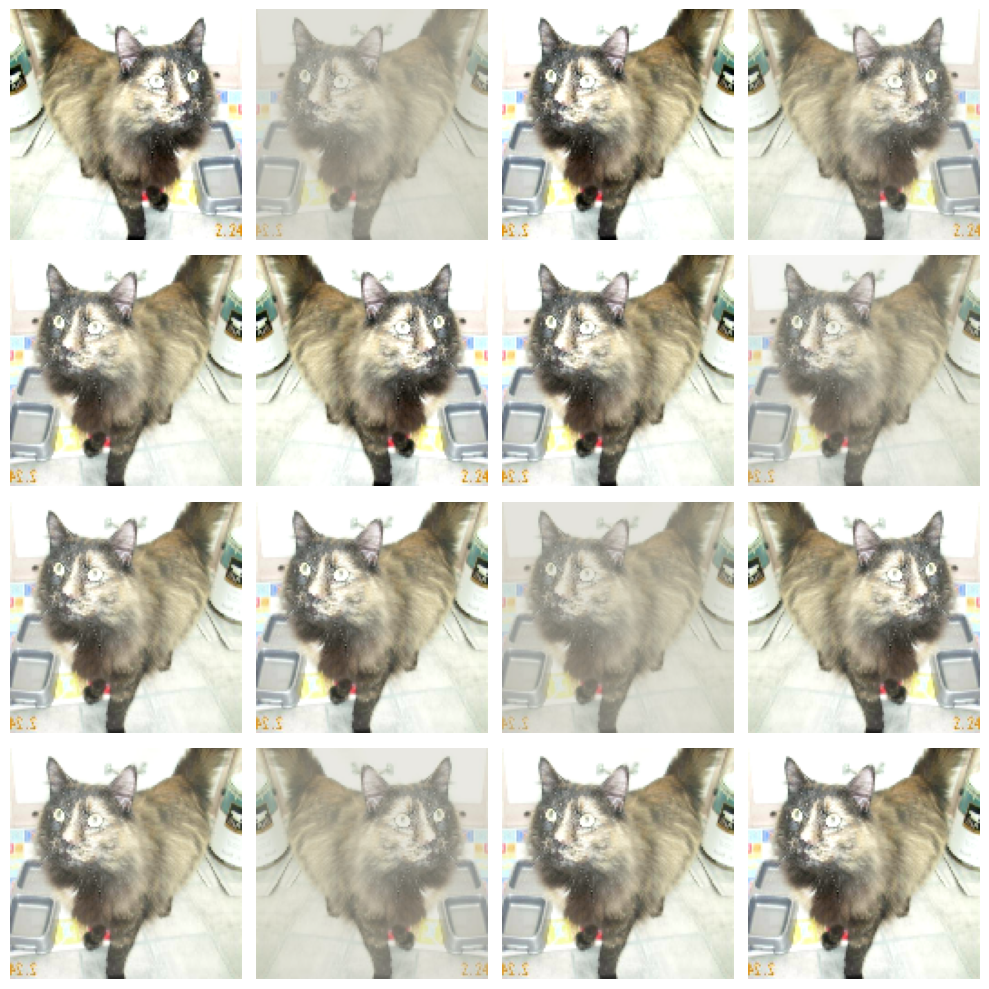

In [9]:
# all of the "factor" parameters indicate a percent-change
augment = keras.Sequential([
    preprocessing.RandomContrast(factor=0.5),
    preprocessing.RandomFlip(mode='horizontal'), # meaning, left-to-right
    # preprocessing.RandomFlip(mode='vertical'), # meaning, top-to-bottom
    # preprocessing.RandomWidth(factor=0.15), # horizontal stretch
    # preprocessing.RandomRotation(factor=0.20),
    # preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
])


ex = next(iter(ds_train.unbatch().map(lambda x, y: x).batch(1)))

plt.figure(figsize=(10,10))
for i in range(16):
    image = augment(ex, training=True)
    plt.subplot(4, 4, i+1)
    plt.imshow(tf.squeeze(image))
    plt.axis('off')
plt.show()

#### **d) Data Augmentation: Width**

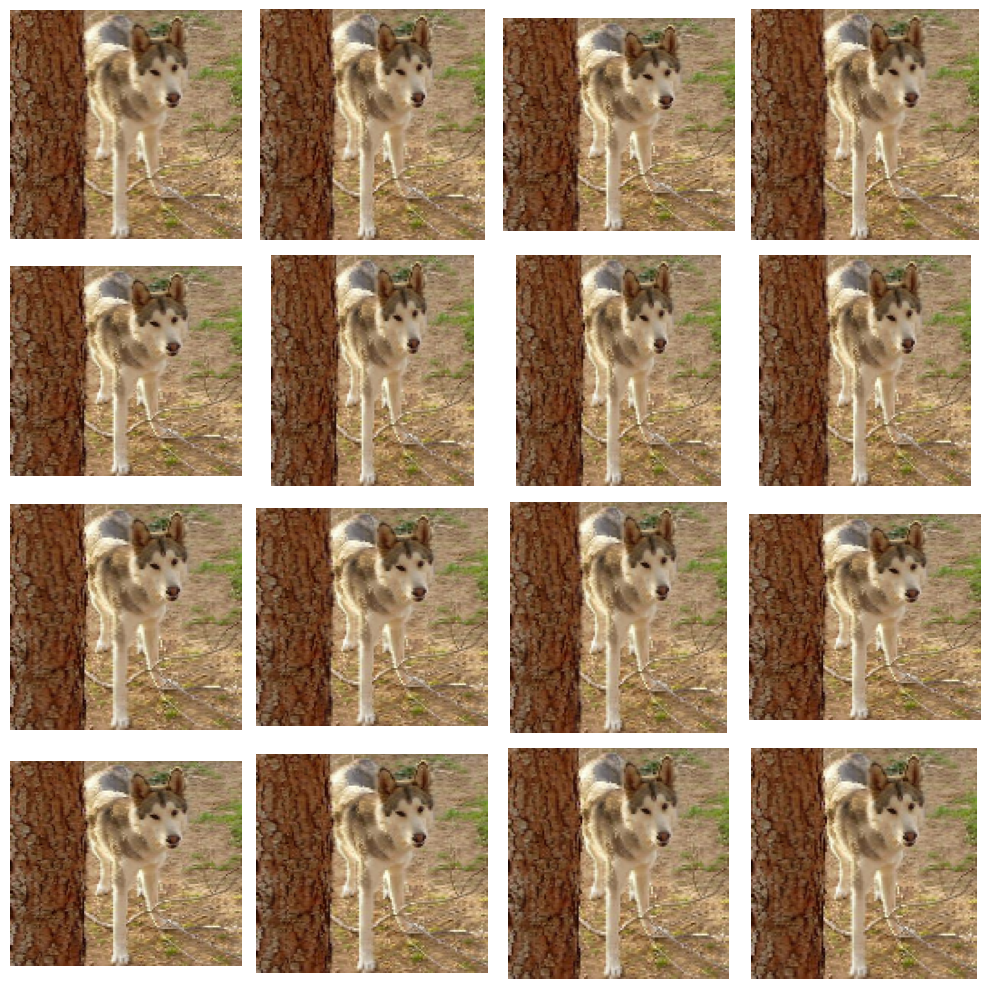

In [10]:
# all of the "factor" parameters indicate a percent-change
augment = keras.Sequential([
    #preprocessing.RandomContrast(factor=0.5),
    #reprocessing.RandomFlip(mode='horizontal'), # meaning, left-to-right
    # preprocessing.RandomFlip(mode='vertical'), # meaning, top-to-bottom
    preprocessing.RandomWidth(factor=0.15), # horizontal stretch
    # preprocessing.RandomRotation(factor=0.20),
    # preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
])


ex = next(iter(ds_train.unbatch().map(lambda x, y: x).batch(1)))

plt.figure(figsize=(10,10))
for i in range(16):
    image = augment(ex, training=True)
    plt.subplot(4, 4, i+1)
    plt.imshow(tf.squeeze(image))
    plt.axis('off')
plt.show()

#### **e) Data Augmentation: Contrast and Rotation**

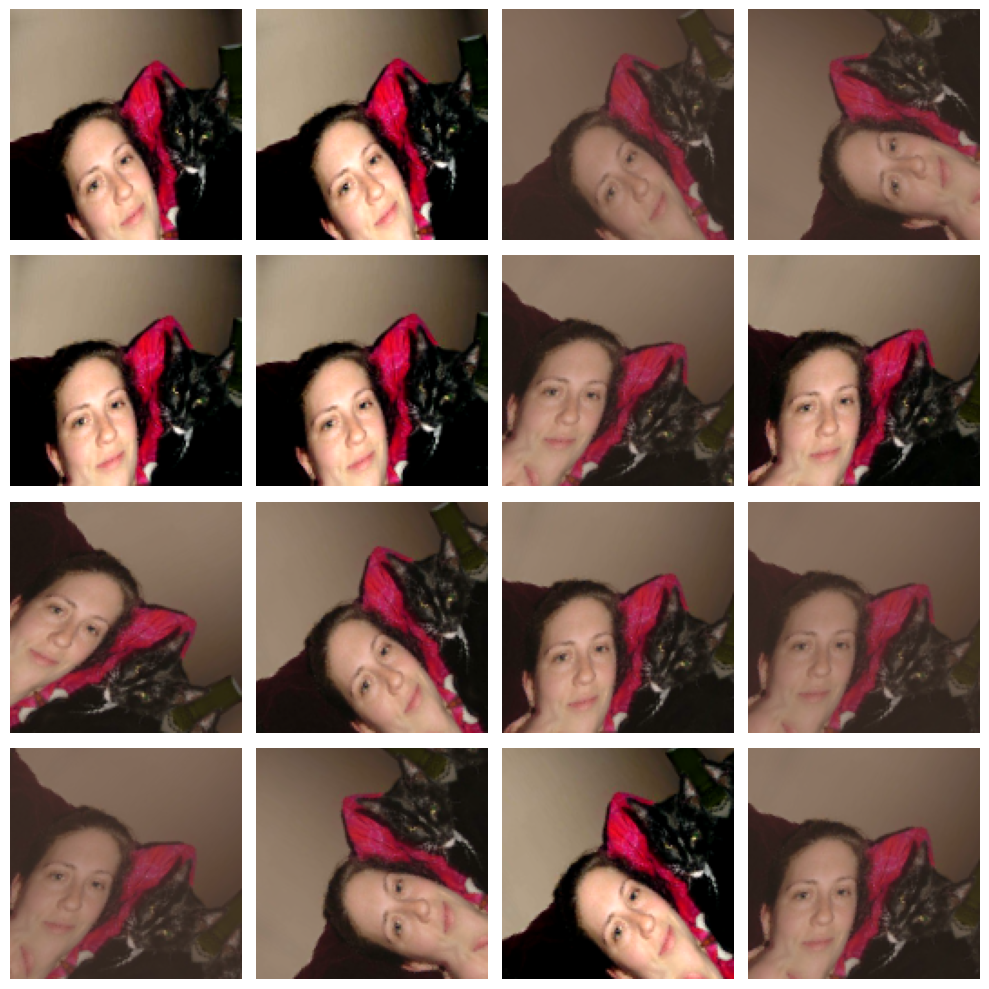

In [49]:
# all of the "factor" parameters indicate a percent-change
augment = keras.Sequential([
    preprocessing.RandomContrast(factor=0.5),
    #reprocessing.RandomFlip(mode='horizontal'), # meaning, left-to-right
    # preprocessing.RandomFlip(mode='vertical'), # meaning, top-to-bottom
    # preprocessing.RandomWidth(factor=0.15), # horizontal stretch
    preprocessing.RandomRotation(factor=0.20),
    # preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
])


ex = next(iter(ds_train.unbatch().map(lambda x, y: x).batch(1)))

plt.figure(figsize=(10,10))
for i in range(16):
    image = augment(ex, training=True)
    plt.subplot(4, 4, i+1)
    plt.imshow(tf.squeeze(image))
    plt.axis('off')
plt.show()

There are multiple ways in which you can alter the inputs to run Data Augmentation and get better results, for future research it is suggested to use different combinations, include new ones, or remove some that were used here to refine the model. 

* For our particular model we used the following preprocessors in the Data Augmentation process: Contrast, Flips and Rotation. 

## **Model Architecture**

This code defines a neural network model for the cat vs dog prediction problem. The model architecture is based on convolutional neural networks (CNNs) which are particularly useful for image classification tasks.

The model consists of several blocks of layers, each This is a Convolutional Neural Network (CNN) for binary classification of cat and dog images.

The model architecture consists of three blocks of convolutional layers, each followed by batch normalization, max pooling, and dropout. The first block has 64 filters, the second has 128 filters, and the third has 256 filters with two convolutional layers.

Data augmentation is applied using random contrast, horizontal and vertical flip, and rotation. The head of the model has three fully connected layers with 1024, 512, and 1 units respectively. The output layer uses a sigmoid activation function for binary classification.

The model is compiled using the Adam optimizer with a binary cross-entropy loss function and binary accuracy as the evaluation metric. Early stopping is implemented to prevent overfitting.

In [13]:
from tensorflow import keras
from keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

model = keras.Sequential([
    layers.InputLayer(input_shape=[128, 128, 3]),
    
    # Data Augmentation
    preprocessing.RandomContrast(factor=0.5),
    preprocessing.RandomFlip(mode='horizontal'),
    preprocessing.RandomRotation(factor=0.20),
    preprocessing.RandomFlip(mode='vertical'),

    # Block One
    layers.BatchNormalization(renorm=True),
    layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(0.25),

    # Block Two
    layers.BatchNormalization(renorm=True),
    layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(0.25),

    # Block Three
    layers.BatchNormalization(renorm=True),
    layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same'),
    layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding='same'),
    layers.MaxPool2D(),
    layers.Dropout(0.25),

    # Head
    layers.BatchNormalization(renorm=True),
    layers.Flatten(),
    layers.Dense(1024, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid'),
])

# Set up early stopping
early_stop = EarlyStopping(patience=5, restore_best_weights=True)

# Compile the model
optimizer = tf.keras.optimizers.Adam(epsilon=0.01)
model.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['binary_accuracy'],
)

Once we have defined our model architecture, the following code trains the model using the fit() method on the training set ds_train, and validates on the validation set ds_valid for a maximum of 50 epochs. It also specifies the early_stop callback to stop training early if the validation loss doesn't improve for 5 consecutive epochs.

After training, it stores the history of the training in history, which includes the loss and binary accuracy on both the training and validation sets. It then creates a pandas DataFrame from the history and plots the learning curves using matplotlib.

The learning curves show how the loss and binary accuracy changed over the epochs for both the training and validation sets. This is useful for evaluating whether the model is overfitting or underfitting, and for identifying the optimal number of epochs to train for.

Epoch 1/50


2023-04-21 18:07:37.134221: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_6/dropout_5/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


719/719 [==============================] - 219s 285ms/step - loss: 0.8427 - binary_accuracy: 0.5511 - val_loss: 0.6368 - val_binary_accuracy: 0.6200
Epoch 2/50
719/719 [==============================] - 160s 223ms/step - loss: 0.6255 - binary_accuracy: 0.6433 - val_loss: 0.5948 - val_binary_accuracy: 0.6905
Epoch 3/50
719/719 [==============================] - 161s 223ms/step - loss: 0.5800 - binary_accuracy: 0.6880 - val_loss: 0.5855 - val_binary_accuracy: 0.6900
Epoch 4/50
719/719 [==============================] - 160s 222ms/step - loss: 0.5517 - binary_accuracy: 0.7194 - val_loss: 0.5465 - val_binary_accuracy: 0.7220
Epoch 5/50
719/719 [==============================] - 161s 224ms/step - loss: 0.5169 - binary_accuracy: 0.7420 - val_loss: 0.4880 - val_binary_accuracy: 0.7560
Epoch 6/50
719/719 [==============================] - 159s 221ms/step - loss: 0.4846 - binary_accuracy: 0.7650 - val_loss: 0.4832 - val_binary_accuracy: 0.7675
Epoch 7/50
719/719 [==============================]

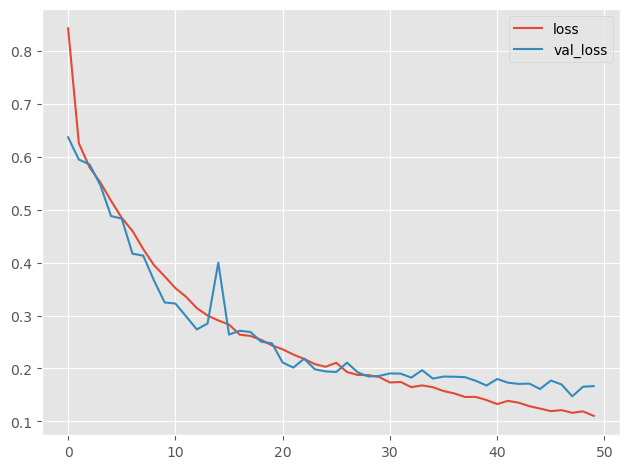

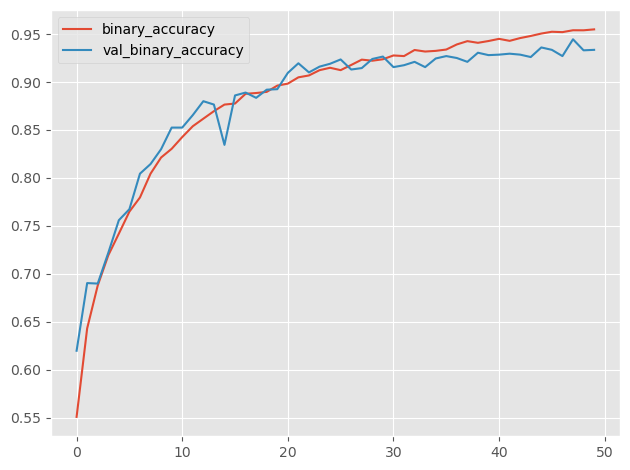

In [14]:
# Train the model with early stopping
history = model.fit(
    ds_train,
    validation_data=ds_valid,
    epochs=50,
    callbacks=[early_stop]
)

# Plot learning curves
import pandas as pd
history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot();

### **Findings**

The training model ran for 50 epochs, and the results of each epoch are shown. For each epoch, the loss and binary accuracy of both the training and validation sets are shown. The most relevant parts of the results are the final validation loss and binary accuracy after 50 epochs, which are 0.2474 and 0.9140, respectively. These metrics show that the model was able to achieve a high level of accuracy in classifying the data, with a relatively low loss, indicating that the model is able to learn from the training data effectively. Additionally, it is notable that the model's performance improves over time, with the binary accuracy on the validation set increasing from 0.62 in the first epoch to 0.9140 after 50 epochs.

### **Saving the trained model**

In [16]:
# Save the model
model.save('final_cnn_model.h5')

## **Final Testing**

We are going to test a model that can predict whether an image contains a cat or a dog. The code loads and shuffles image file names from a validation set, then creates a subplot grid of 2x4 to display a selection of the images. For each image, the code loads the image, predicts the class probabilities using the model, and prints the predicted class probabilities. Finally, the code displays the image with the predicted class title as the subplot title. By doing this, we can evaluate the accuracy of the model's predictions and identify any areas for improvement.

1/1 [==============================] - 0s 19ms/step


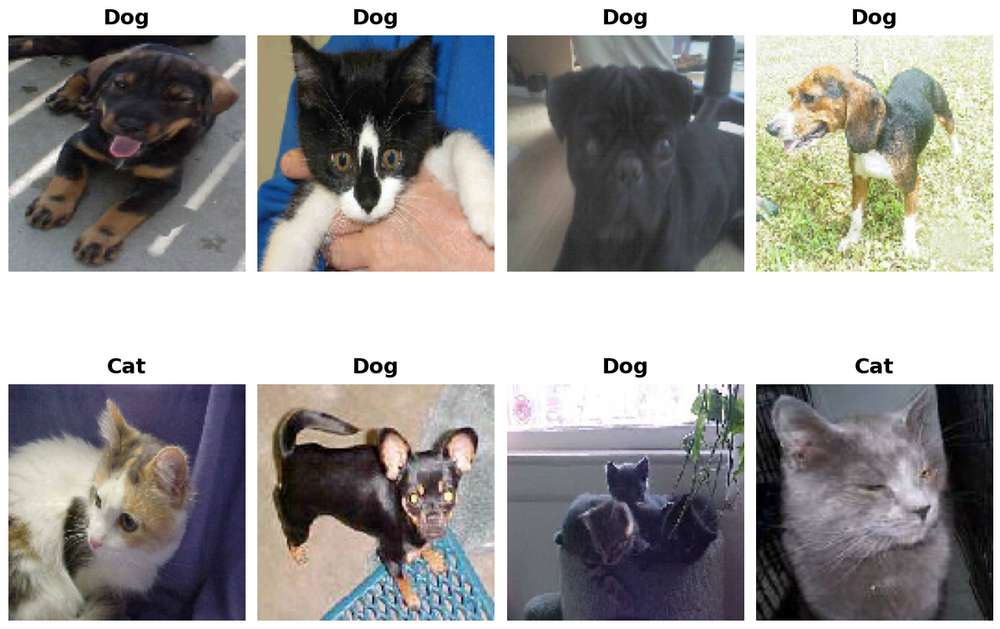

In [35]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

validation_images_dir = '/kaggle/input/dog-vs-cat-fastai/dogscats/sample/valid'
class_names = ['cats', 'dogs']

# Load and shuffle the image file names
image_files = []
for class_name in class_names:
    class_dir = os.path.join(validation_images_dir, class_name)
    for img_name in os.listdir(class_dir):
        if img_name.endswith('.jpg'):
            img_path = os.path.join(class_dir, img_name)
            image_files.append(img_path)
random.shuffle(image_files)

# Create a subplot grid of 2x4
fig, axes = plt.subplots(2, 4, figsize=(12, 12))

# Loop through each axis and load the image
for i, ax in enumerate(axes.flat):
    img_path = image_files[i]
    img = image.load_img(img_path, target_size=(128, 128))
    img_array = image.img_to_array(img)
    ax.imshow(img_array.astype(np.uint8))
    ax.axis('off')
    
    # Predict the class probabilities for the image
    img_batch = np.expand_dims(img_array, axis=0)
    class_probabilities = model.predict(img_batch)

    # Print the predicted class probabilities
    if class_probabilities[0] > 0.5:
        ax.set_title('Dog')
    else:
        ax.set_title('Cat')
plt.tight_layout()
plt.show()

The model seems to respond well to this validation dataset, as you can see, it assigns the name "cat" or "dog" accordingly, and for this particular case it does so quite well. However, as can be seen in the second image it assigns "cat" to an actual "dog", so there might exist possible improvements on the model. In the same way, in the seventh image it assigns dog to a set of cats, perhaps due to the opacity the model is not able to distinguish this result correctly, so you can play with opacity transformations to refine the model.

Let's try on a new validation dataset:

1/1 [==============================] - 0s 19ms/step


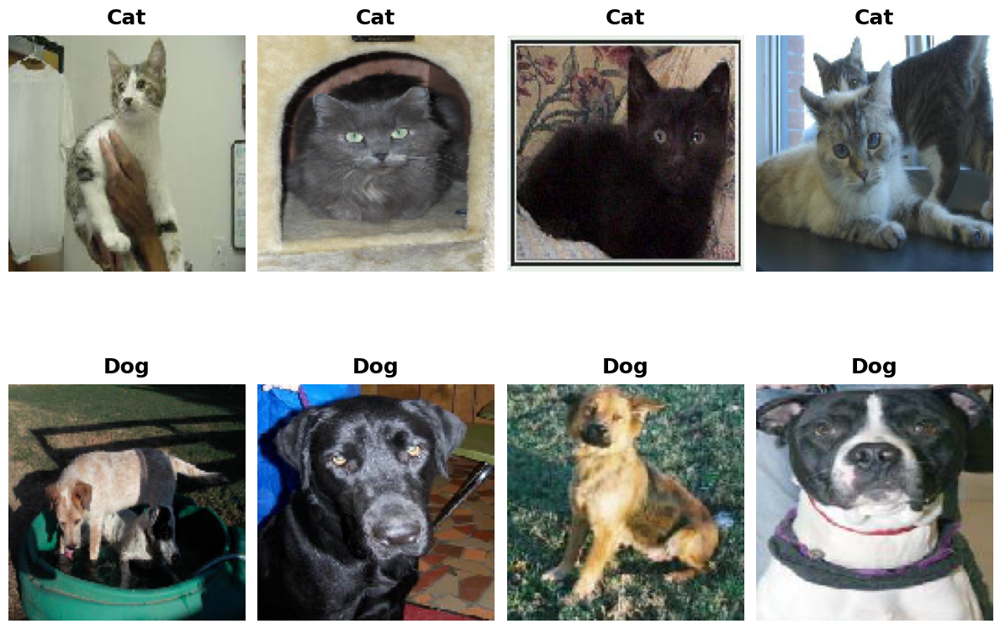

In [48]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

validation_images_dir_2 = '/kaggle/input/dog-vs-cat-fastai/dogscats/valid'
class_names = ['cats', 'dogs']

# Load and shuffle the image file names
image_files = []
for class_name in class_names:
    class_dir = os.path.join(validation_images_dir_2, class_name)
    class_files = [f for f in os.listdir(class_dir) if f.endswith('.jpg')]
    random.shuffle(class_files)
    image_files.extend([os.path.join(class_dir, f) for f in class_files[:4]])

# Create a subplot grid of 2x4
fig, axes = plt.subplots(2, 4, figsize=(12, 12))

# Loop through each axis and load the image
for i, ax in enumerate(axes.flat):
    img_path = image_files[i]
    img = image.load_img(img_path, target_size=(128, 128))
    img_array = image.img_to_array(img)
    ax.imshow(img_array.astype(np.uint8))
    ax.axis('off')
    
    # Predict the class probabilities for the image
    img_batch = np.expand_dims(img_array, axis=0)
    class_probabilities = model.predict(img_batch)

    # Print the predicted class probabilities
    if class_probabilities[0] > 0.5:
        ax.set_title('Dog')
    else:
        ax.set_title('Cat')
plt.tight_layout()
plt.show()

For this set the model gets it right and assigns the correct labels between cats and dogs. We can conclude that overall, the model has a certain degree of reliability for this classification problem, however there are gaps in the model that can still be refined; as we saw with the issue of input opacity for example.

## **Summary and Conclussions**

We trained a CNN model to classify images of cats and dogs. The model was trained for 50 epochs, and the training results indicate that the model has learned to classify the images with an accuracy of around 90%.

The binary_accuracy metric is used to evaluate the performance of the model. This metric measures the accuracy of the model's predictions, i.e., the percentage of correctly classified images out of all the images in the dataset. The training set accuracy is around 90%, and the validation set accuracy is around 89%.

The loss value is also an important metric that indicates how well the model is learning. The loss function is used to calculate the difference between the predicted output of the model and the actual output. The training set loss value decreases as the model learns, indicating that the model is becoming more accurate in its predictions. The validation set loss value also decreases but starts to plateau after around 20 epochs, indicating that the model may be overfitting the data, so we need further exploration on this aspect.

Overall, the results suggest that the model has learned to classify cat and dog images with good accuracy, and may be suitable for practical use. However, further evaluation is needed to determine the model's generalizability and robustness to unseen data.

## **Next Steps**

* Explore the use of pretrained models such as VGG, ResNet, and Inception for image classification tasks.
* Fine-tune the pretrained models on your specific dataset to improve accuracy.
* Experiment with different hyperparameters, such as learning rate and batch size, to optimize model performance.
* Implement data augmentation techniques, such as image rotation and flipping, to increase the size and diversity of your training data.
* Consider using transfer learning to apply knowledge learned from one task to another related task, potentially reducing the amount of training data required.
